# **Lens Finding in Galaxies**
### **Test II: Identifying Lenses**

This notebook addresses the task of building a deep learning model to identify lensed galaxies from observational data using PyTorch or Keras.

### **Dataset Description**
- **Lensed Galaxies**: Images of galaxies exhibiting strong lensing effects
- **Non-Lensed Galaxies**: Images of galaxies without lensing effects

**Image Format**: Each object has images in three different filters,in the shape of `(3, 64, 64)`.

# Loading and Visualizing the images

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

a = np.load("/kaggle/input/gsoc-lens/train_lenses/1.npy")
b = np.load("/kaggle/input/gsoc-lens/train_nonlenses/1.npy")
print(a.shape)

print(np.min(a))
print(np.max(a))

(3, 64, 64)
0.0
1.0


# Seems like the images are min-max normalized. We'll try to convert them back to the original scale (0-255) for visualization by multiplying the array values by 255 and casting them to uint8.

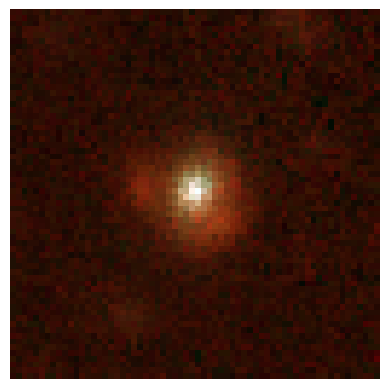

In [2]:

np_array = np.uint8(a * 255)
plt.imshow(np_array.transpose(1, 2, 0))
plt.axis('off')
plt.show()

# Visualizing the lenses and non lenses images to understand the patters.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os

def visualize_images(images, title, n_rows=10, n_cols=10):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20))
    fig.suptitle(title, fontsize=16)
    for i in range(n_rows * n_cols):
        ax = axes[i // n_cols, i % n_cols]
        if i < len(images):
            img = np.uint8(images[i] * 255).transpose(1, 2, 0)  
            ax.imshow(img)
            ax.axis('off')
        else:
            ax.axis('off')
    plt.tight_layout()
    plt.show()

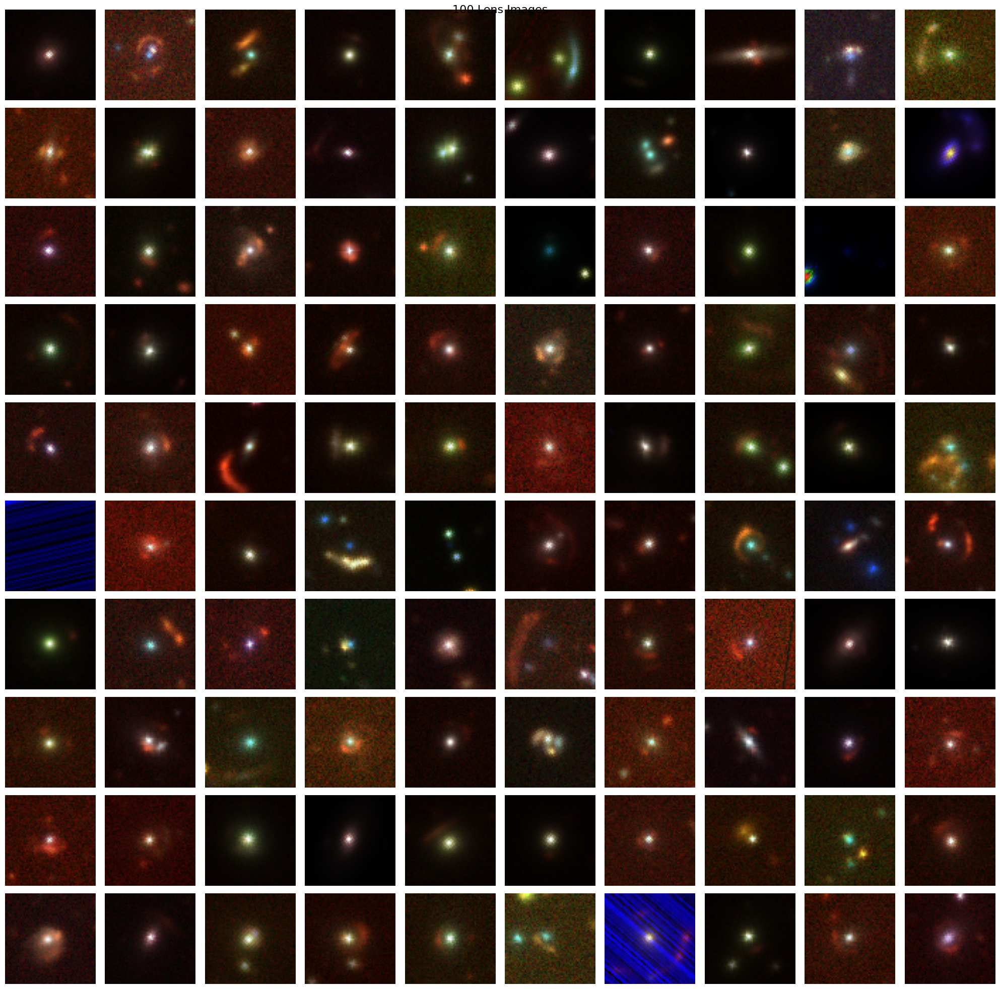

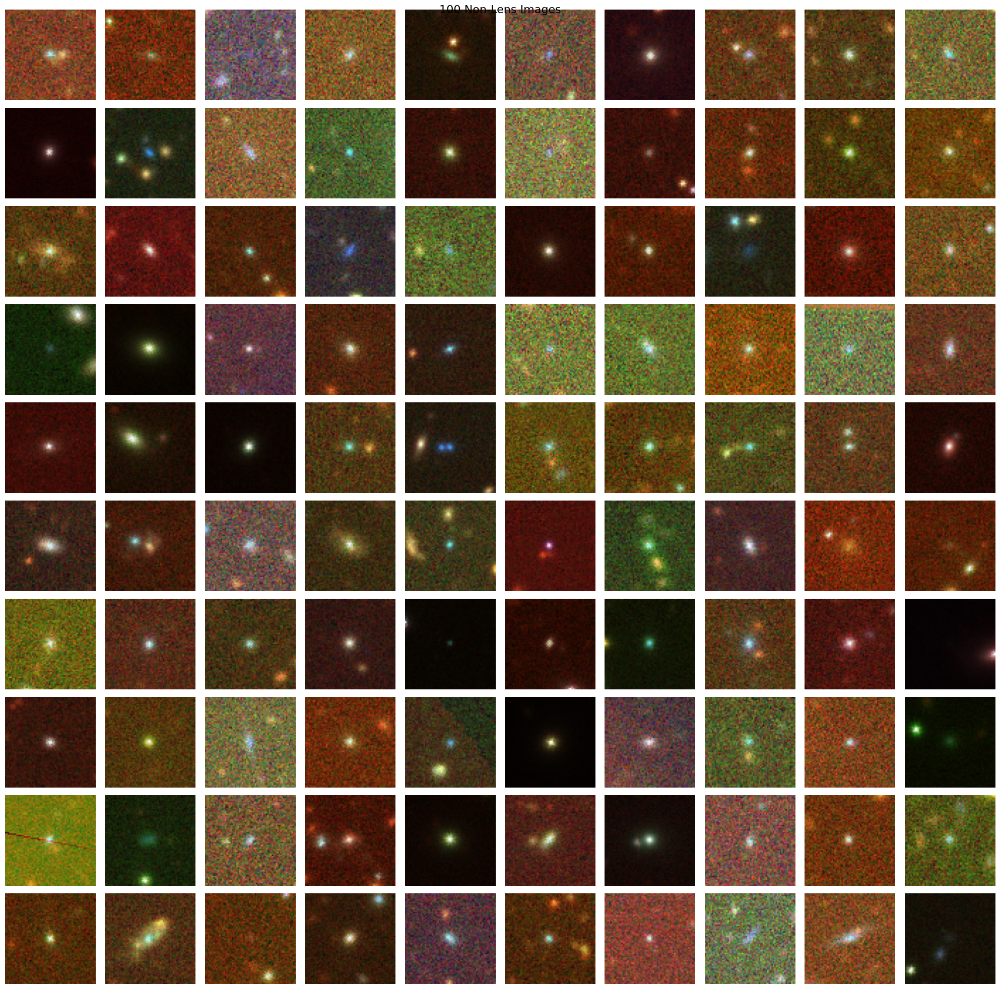

In [4]:
# Lens directory and visualization
lens_dir = "/kaggle/input/gsoc-lens/train_lenses/"
lens_images = [np.load(os.path.join(lens_dir, file)) for file in os.listdir(lens_dir)[:100]]
visualize_images(lens_images, title="100 Lens Images", n_rows=10, n_cols=10)

# Non-lens directory and visualization
nonlens_dir = "/kaggle/input/gsoc-lens/train_nonlenses/"
nonlens_images = [np.load(os.path.join(nonlens_dir, file)) for file in os.listdir(nonlens_dir)[:100]]
visualize_images(nonlens_images, title="100 Non-Lens Images", n_rows=10, n_cols=10)

### Converting Numpy Files to PNGs
The following code converts numpy arrays (`.npy` files) to PNG images for the following reasons:
1. **Model Compatibility**: Pre-trained models like EfficientNet expect images in formats such as PNG or JPEG.
3. **Integration with Libraries**: Libraries like `torchvision.transforms` work with standard image formats, simplifying preprocessing.


In [5]:
import numpy as np
import os
from PIL import Image
def convert_npy_to_png(src_dir, dest_dir):
    os.makedirs(dest_dir, exist_ok=True)
    for file_name in os.listdir(src_dir):
        if file_name.endswith('.npy'):
            src_file = os.path.join(src_dir, file_name)
            dest_file = os.path.join(dest_dir, file_name.replace('.npy', '.png'))
            np_array = np.load(src_file)
            np_array = np.uint8(np_array * 255)
            img = Image.fromarray(np.transpose(np_array, (1, 2, 0)))
            img.save(dest_file)
    print(f"Conversion complete for {src_dir}!")

In [6]:

train_lenses_dir = '/kaggle/input/gsoc-lens/train_lenses'  
train_lenses_dest = '/kaggle/working/train/train_lenses'  

train_non_lenses_dir = '/kaggle/input/gsoc-lens/train_nonlenses' 
train_non_lenses_dest = '/kaggle/working/train/train_non_lenses'  

test_non_lenses_dir = '/kaggle/input/gsoc-lens/test_nonlenses' 
test_non_lenses_dest = '/kaggle/working/test/test_non_lenses'

test_lenses_dir = '/kaggle/input/gsoc-lens/test_lenses'  
test_lenses_dest = '/kaggle/working/test/test_lenses'


In [7]:
convert_npy_to_png(train_non_lenses_dir, train_non_lenses_dest)
convert_npy_to_png(train_lenses_dir, train_lenses_dest)
convert_npy_to_png(test_non_lenses_dir, test_non_lenses_dest)
convert_npy_to_png(test_lenses_dir, test_lenses_dest)

Conversion complete for /kaggle/input/gsoc-lens/train_nonlenses!
Conversion complete for /kaggle/input/gsoc-lens/train_lenses!
Conversion complete for /kaggle/input/gsoc-lens/test_nonlenses!
Conversion complete for /kaggle/input/gsoc-lens/test_lenses!


In [8]:
import os

root_dir = '/kaggle/working/train'
for subdir in os.listdir(root_dir):
    subdir_path = os.path.join(root_dir, subdir)
    num_files = len([f for f in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, f))])
    print(f"Directory '{subdir}' contains {num_files} files.")


Directory 'train_lenses' contains 1730 files.
Directory 'train_non_lenses' contains 28675 files.


# EfficientNetB0 for Binary Classification

1. **Device Setup**: Automatically selects GPU if available.  
2. **Pre-trained Model**: EfficientNetB0 loaded from `torchvision`.  
3. **Custom Classifier**: Replaced default classifier with fully connected layers for binary classification:
   - Input → 128 → 64 → 2 (binary output).
   - ReLU activations

In [9]:
import torch
import torch.nn as nn
from torchvision import models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.efficientnet_b0(pretrained=True)

model.classifier = nn.Sequential(
    torch.nn.Linear(model.classifier[1].in_features, 128), 
    torch.nn.ReLU(),
    torch.nn.Linear(128, 64),
    torch.nn.ReLU(),
    torch.nn.Linear(64, 2)  
)
model = model.to(device)



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 123MB/s] 


### Image Transformations

For training, we prepare the images by resizing them to 224x224, applying random flips and slight rotations (up to 10°), converting them into tensors, and normalizing them with standard ImageNet mean and standard deviation values.

For testing, we keep it simpler. The images are resized to 224x224, converted to tensors, and normalized using the same mean and standard deviation as the training images. This ensures consistency during evaluation.

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms, models
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score, f1_score
import numpy as np

train_dir = "/kaggle/working/train"
test_dir = "/kaggle/working/test"

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

In [11]:
# Datasets
train_dataset = datasets.ImageFolder(root=train_dir, transform=train_transform)
test_dataset = datasets.ImageFolder(root=test_dir, transform=test_transform)

# Train-validation split (90-10 split)
train_size = int(0.9 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

# DataLoaders
train_loader = DataLoader(train_subset, batch_size=64, shuffle=True, pin_memory=True)
val_loader = DataLoader(val_subset, batch_size=64, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=64, pin_memory=True)

### Handling Class Imbalance

To address class imbalance:

1. **Class Weight Calculation**:  
   Class weights are computed as:  
   weight_i = Total Samples / Samples in Class i

   This ensures the minority class gets higher weight.

3. **Integration with Loss Function**:  
   The calculated weights are passed to the `CrossEntropyLoss` function, encouraging the model to pay more attention to underrepresented classes.

4. **Optimization**:  
   The model is optimized using the `Adam` optimizer with a learning rate of 1 x 10^-4.

In [12]:
# Class weights for handling class imbalance
class_weights = torch.tensor([len(train_dataset) / train_dataset.targets.count(0), 
                              len(train_dataset) / train_dataset.targets.count(1)], device=device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=1e-4)

## Training Loop

The `train_epoch` function performs one training epoch by:

1. Setting the model to training mode.
2. Iterating over batches in the dataloader, calculating the loss, and updating model weights.
3. Accumulating the loss over the entire epoch.
4. Returning the average loss for the epoch.

This process helps improve the model's performance by adjusting its parameters.

In [13]:
# Training Loop
def train_epoch(model, dataloader, optimizer, criterion):
    model.train()
    running_loss = 0.0
    for inputs, labels in dataloader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    return running_loss / len(dataloader)

## Model Evaluation

The `evaluate_model` function evaluates the model's performance by:

1. Setting the model to evaluation mode.
2. Calculating predictions and probabilities over a dataset.
3. Computing accuracy, AUC score, and F1 score.
4. Optionally, plotting the ROC curve if `roc=True`.

The function returns the accuracy, AUC score, and F1 score. If `return_pred=True`, it also returns the true labels, predicted labels, and other metrics.

In [14]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve,auc

def evaluate_model(model, dataloader,roc=False,return_pred=False):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = [] 
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            all_probs.extend(probs)
    auc_score = roc_auc_score(all_labels, all_probs)
    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    if roc:
        fpr, tpr, thresholds = roc_curve(all_labels, all_probs)
        roc_auc = auc(fpr, tpr)
        
        # Plot the ROC curve
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label="Random Guess")
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("Receiver Operating Characteristic (ROC) Curve")
        plt.legend(loc="lower right")
        plt.grid(alpha=0.3)
        plt.show()
    if return_pred:
        return all_labels, all_preds, accuracy, auc_score, f1
    else:
        return accuracy, auc_score, f1

## Model Checkpoint Saving

The `save_checkpoint` function saves the model's state dictionary, optimizer's state, current epoch, and loss value to a file. This allows for resuming training from a specific point in case of interruptions.

### Training Loop:
1. The model is trained for 10 epochs.
2. After each epoch, the validation performance (AUC, accuracy, and F1 score) is evaluated.
3. If the validation AUC improves, the model's state is saved using `save_checkpoint`.
4. The best model is saved in a file with the format `best_checkpoint_epoch_{epoch}.pth`.


In [15]:
def save_checkpoint(model, optimizer, epoch, loss, filename="checkpoint.pth"):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, filename)

num_epochs = 10
best_auc = 0.0  

for epoch in range(num_epochs):
    train_loss = train_epoch(model, train_loader, optimizer, criterion)
    accuracy, val_auc, val_f1 = evaluate_model(model, val_loader)
    if val_auc > best_auc:
        best_auc = val_auc
        save_checkpoint(model, optimizer, epoch, train_loss, filename=f"best_checkpoint_epoch_{epoch+1}.pth")
    
    print(f"Epoch {epoch+1}, Loss: {train_loss:.4f}, Validation AUC: {val_auc:.4f},Accuracy: {accuracy:.4f},Test_F1: {val_f1:.4f} ")

Epoch 1, Loss: 0.3099, Validation AUC: 0.9831,Accuracy: 0.8714,Test_F1: 0.9272 
Epoch 2, Loss: 0.1797, Validation AUC: 0.9867,Accuracy: 0.9602,Test_F1: 0.9786 
Epoch 3, Loss: 0.1516, Validation AUC: 0.9871,Accuracy: 0.9474,Test_F1: 0.9715 
Epoch 4, Loss: 0.1314, Validation AUC: 0.9862,Accuracy: 0.9592,Test_F1: 0.9781 
Epoch 5, Loss: 0.1116, Validation AUC: 0.9888,Accuracy: 0.9477,Test_F1: 0.9717 
Epoch 6, Loss: 0.0997, Validation AUC: 0.9852,Accuracy: 0.9596,Test_F1: 0.9783 
Epoch 7, Loss: 0.0936, Validation AUC: 0.9894,Accuracy: 0.9632,Test_F1: 0.9802 
Epoch 8, Loss: 0.0931, Validation AUC: 0.9912,Accuracy: 0.9543,Test_F1: 0.9753 
Epoch 9, Loss: 0.0769, Validation AUC: 0.9847,Accuracy: 0.9622,Test_F1: 0.9797 
Epoch 10, Loss: 0.0779, Validation AUC: 0.9841,Accuracy: 0.9204,Test_F1: 0.9562 


## Testing the model

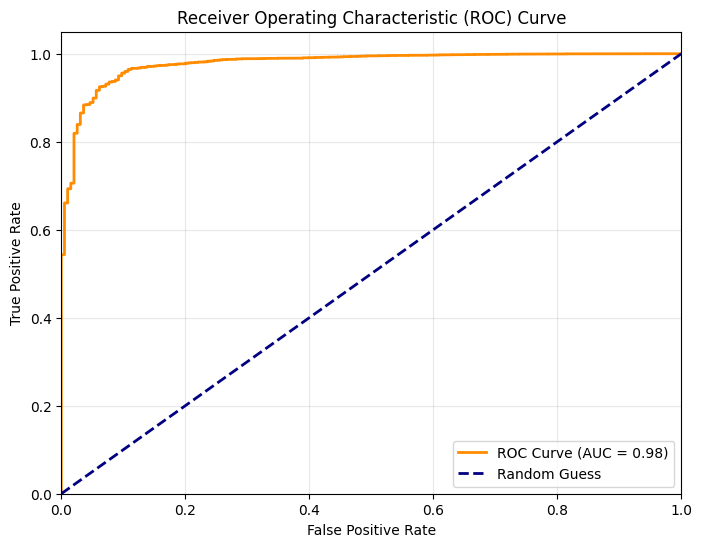

Test Accuracy: 0.9148
Test AUC: 0.9782
Test F1 Score: 0.9550


In [17]:
# Test the model
accuracy, auc_score, f1 = evaluate_model(model, test_loader,True)
print(f"Test Accuracy: {accuracy:.4f}")
print(f"Test AUC: {auc_score:.4f}")
print(f"Test F1 Score: {f1:.4f}")  


## Future Work: Misclassification Analysis

A deeper analysis of misclassified images can provide valuable insights into the model's performance and highlight areas for improvement. Given the current computational constraints, this analysis will be part of future work.
